In [1]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
from glob import glob

In [2]:
# Configure the environment
plt.figure(figsize=(12, 10))
%matplotlib inline

# Define paths to your dataset
data_root = "/Users/sherwood/Desktop/study/EPFL/IM/project/dataset_project_iapr2025"
train_dir = os.path.join(data_root, "train")
val_dir = os.path.join(data_root, "test")

<Figure size 1200x1000 with 0 Axes>

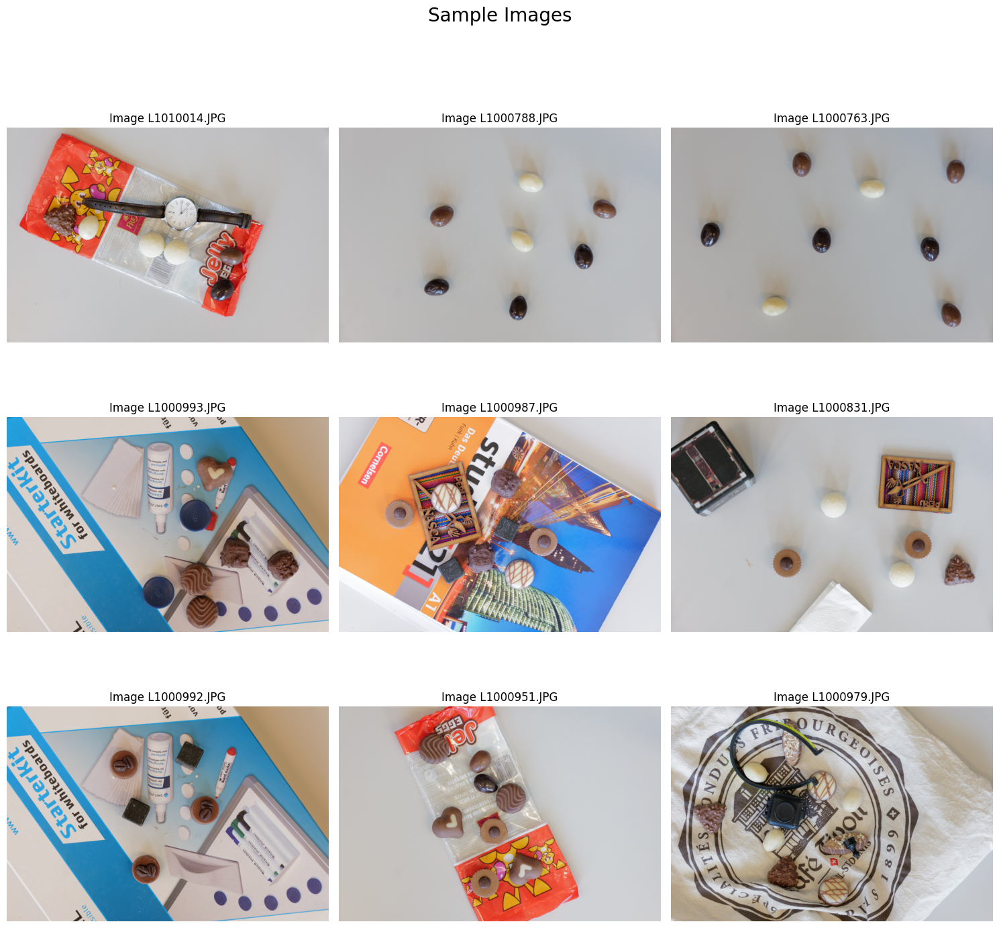

In [3]:
image_paths = glob(os.path.join(train_dir, "*.jpg")) + glob(os.path.join(train_dir, "*.JPG"))
rows=3
cols=3
title="Sample Images"

plt.figure(figsize=(15, 15))
plt.suptitle(title, fontsize=20)

for i, img_path in enumerate(image_paths[:rows*cols]):
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB
    
    plt.subplot(rows, cols, i+1)
    plt.imshow(img)
    plt.title(f"Image {os.path.basename(img_path)}")
    plt.axis('off')

plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()


Image Analysis:
Image size range: (6000, 4000) to (6000, 4000)
Aspect ratio range: 1.50 to 1.50
Average brightness: 168.69


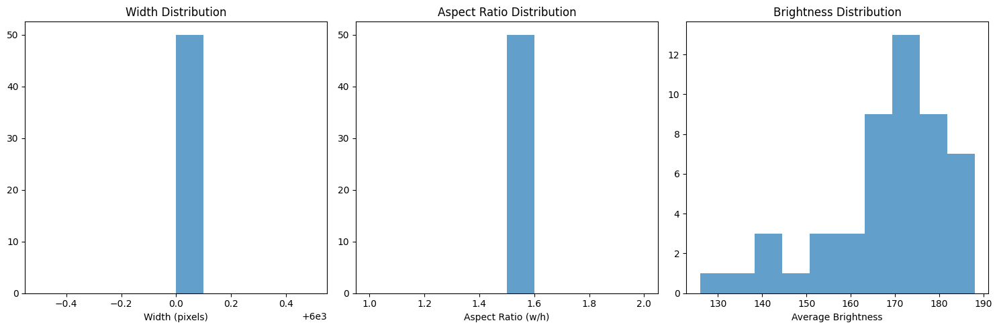

In [4]:
def analyze_image_properties(image_paths, max_samples=50):
    """Analyze basic properties of the dataset images"""
    sizes = []
    aspect_ratios = []
    brightness_values = []
    
    for img_path in image_paths[:max_samples]:
        img = cv2.imread(img_path)
        if img is None:
            continue
            
        # Size and aspect ratio
        h, w = img.shape[:2]
        sizes.append((w, h))
        aspect_ratios.append(w/h)
        
        # Brightness
        gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
        brightness_values.append(np.mean(gray))
    
    return {
        'sizes': sizes,
        'aspect_ratios': aspect_ratios,
        'brightness_values': brightness_values
    }

if image_paths:
    analysis = analyze_image_properties(image_paths)
    
    # Display statistics
    print("\nImage Analysis:")
    print(f"Image size range: {min(analysis['sizes'])} to {max(analysis['sizes'])}")
    print(f"Aspect ratio range: {min(analysis['aspect_ratios']):.2f} to {max(analysis['aspect_ratios']):.2f}")
    print(f"Average brightness: {np.mean(analysis['brightness_values']):.2f}")
    
    # Plot distributions
    plt.figure(figsize=(15, 5))
    
    plt.subplot(1, 3, 1)
    plt.hist([s[0] for s in analysis['sizes']], bins=10, alpha=0.7)
    plt.title('Width Distribution')
    plt.xlabel('Width (pixels)')
    
    plt.subplot(1, 3, 2)
    plt.hist(analysis['aspect_ratios'], bins=10, alpha=0.7)
    plt.title('Aspect Ratio Distribution')
    plt.xlabel('Aspect Ratio (w/h)')
    
    plt.subplot(1, 3, 3)
    plt.hist(analysis['brightness_values'], bins=10, alpha=0.7)
    plt.title('Brightness Distribution')
    plt.xlabel('Average Brightness')
    
    plt.tight_layout()
    plt.show()

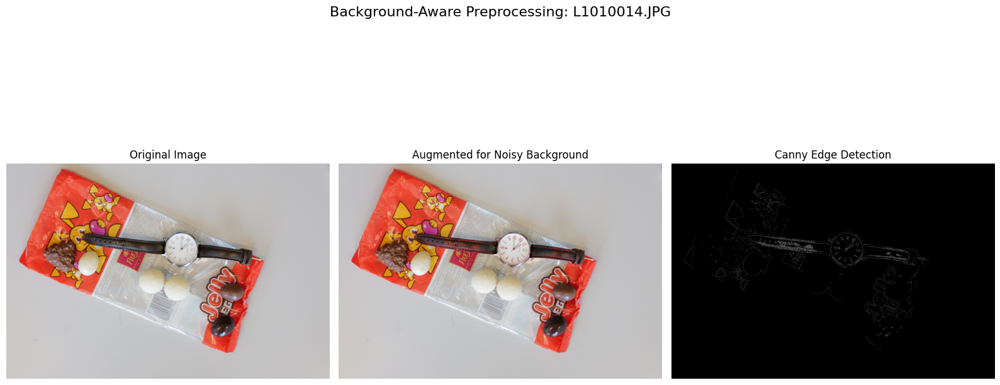

Image L1010014.JPG classified as having a noisy background


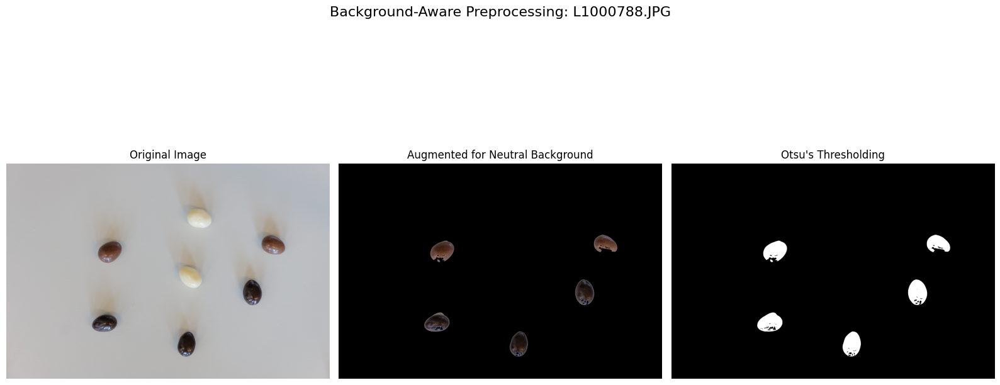

Image L1000788.JPG classified as having a neutral background


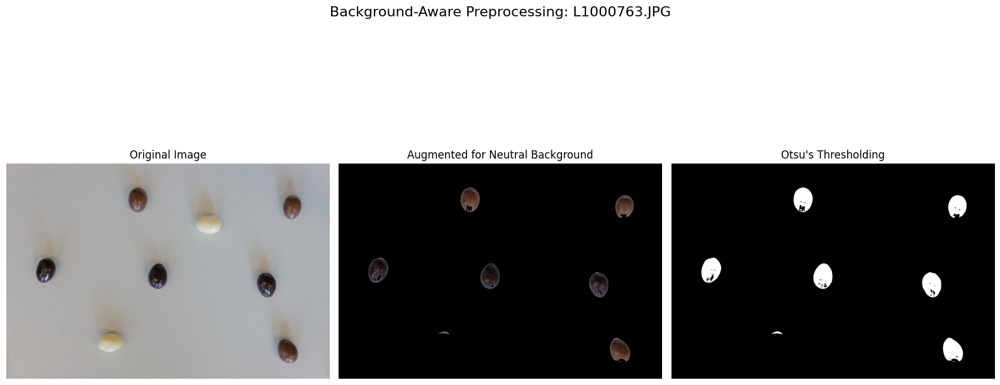

Image L1000763.JPG classified as having a neutral background


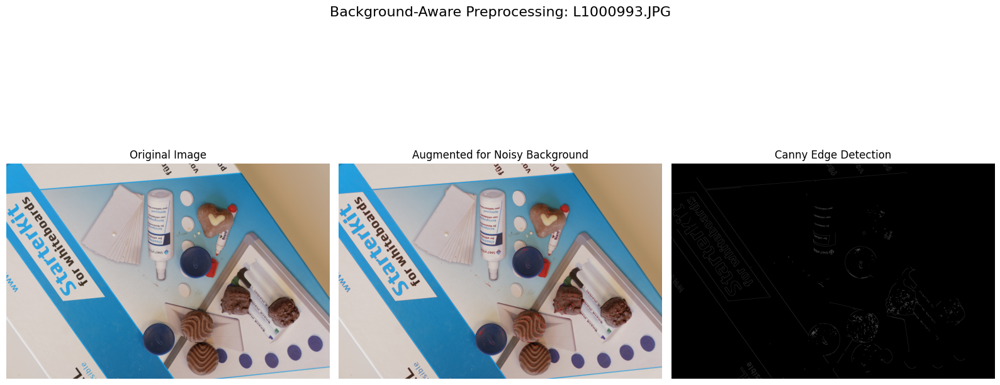

Image L1000993.JPG classified as having a noisy background


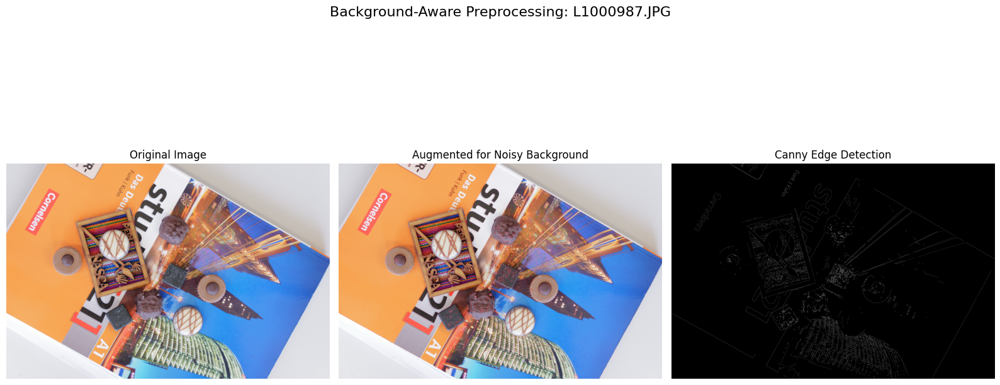

Image L1000987.JPG classified as having a noisy background


In [6]:
num_samples=5
    
# Function to determine if background is likely "neutral" or "noisy"
def classify_background(img):
    # Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2RGB) if len(img.shape) == 3 else img
    
    # Calculate histogram
    hist = cv2.calcHist([gray], [0], None, [256], [0, 256])
    
    # Calculate variance of pixel values
    variance = np.var(gray)
    
    # Calculate number of edges
    edges = cv2.Canny(gray, 50, 150)
    edge_percentage = np.count_nonzero(edges) / edges.size
    
    # Simple heuristic: if variance is low and there are few edges, likely neutral background
    is_neutral = variance < 1500 and edge_percentage < 0.05
    
    return "neutral" if is_neutral else "noisy"

# Process sample images
samples = image_paths[:num_samples]

for img_path in samples:
    img = cv2.imread(img_path)
    if img is None:
        continue
        
    # Original Image (RGB)
    rgb_img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    
    # Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    
    # Detect background type
    background_type = classify_background(gray)
    
    # For neutral backgrounds: Apply Otsu's thresholding
    if background_type == "neutral":
        # Apply Gaussian blur to reduce noise
        blurred = cv2.GaussianBlur(gray, (5, 5), 0)
        
        # Apply Otsu's thresholding
        _, otsu_thresh = cv2.threshold(blurred, 0, 255, 
                                        cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)
        
        # Create a 3-channel version for visualization
        otsu_rgb = cv2.cvtColor(otsu_thresh, cv2.COLOR_GRAY2RGB)
        
        # Optional: Use the threshold as a mask on the original image
        otsu_masked = rgb_img.copy()
        otsu_masked[otsu_thresh == 0] = [0, 0, 0]
        
        augmented_img = otsu_masked  # This would be used for training
        
    # For noisy backgrounds: Apply Gaussian blur followed by Canny edge detection
    else:  # noisy background
        # Apply Gaussian blur
        blurred = cv2.GaussianBlur(gray, (5, 5), 0)
        
        # Apply Canny edge detection
        edges = cv2.Canny(blurred, 50, 150)
        
        # Create a 3-channel version for visualization
        edges_rgb = cv2.cvtColor(edges, cv2.COLOR_GRAY2RGB)
        
        # Optional: Combine original with edge information
        # We'll create a simple visualization here
        edge_overlay = rgb_img.copy()
        edge_overlay[edges > 0] = [255, 0, 0]  # Highlight edges in red
        
        augmented_img = edge_overlay  # This would be used for training
    
    # Display results
    plt.figure(figsize=(16, 8))
    plt.suptitle(f"Background-Aware Preprocessing: {os.path.basename(img_path)}", fontsize=16)
    
    plt.subplot(1, 3, 1)
    plt.imshow(rgb_img)
    plt.title("Original Image")
    plt.axis('off')
    
    plt.subplot(1, 3, 2)
    plt.imshow(augmented_img)
    plt.title(f"Augmented for {background_type.capitalize()} Background")
    plt.axis('off')
    
    # Show intermediate step based on background type
    if background_type == "neutral":
        plt.subplot(1, 3, 3)
        plt.imshow(otsu_thresh, cmap='gray')
        plt.title("Otsu's Thresholding")
        plt.axis('off')
    else:
        plt.subplot(1, 3, 3)
        plt.imshow(edges, cmap='gray')
        plt.title("Canny Edge Detection")
        plt.axis('off')
    
    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()
    
    print(f"Image {os.path.basename(img_path)} classified as having a {background_type} background")

/var/folders/cb/xf0sm7hn1r96833t6t05mrz40000gq/T/ipykernel_39352/2846603730.py:18: UserWarning: Argument(s) 'var_limit' are not valid for transform GaussNoise
  A.GaussNoise(var_limit=(10.0, 50.0), p=0.3),


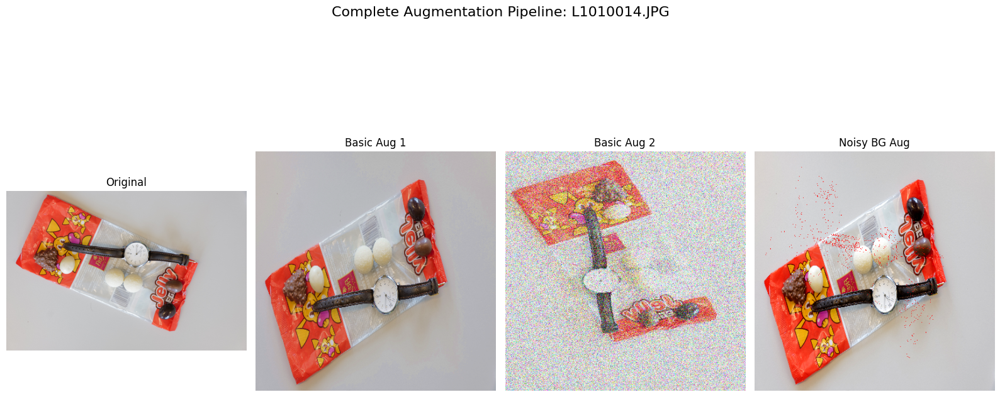

Generated 4 variations for image with noisy background


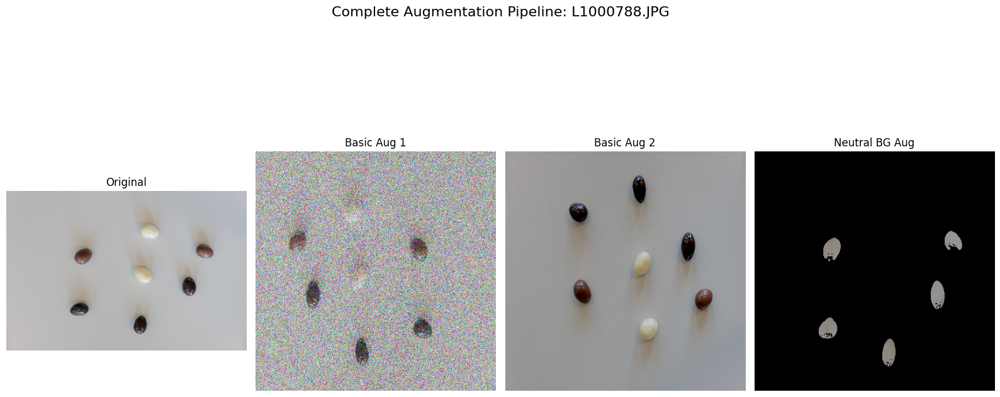

Generated 4 variations for image with neutral background


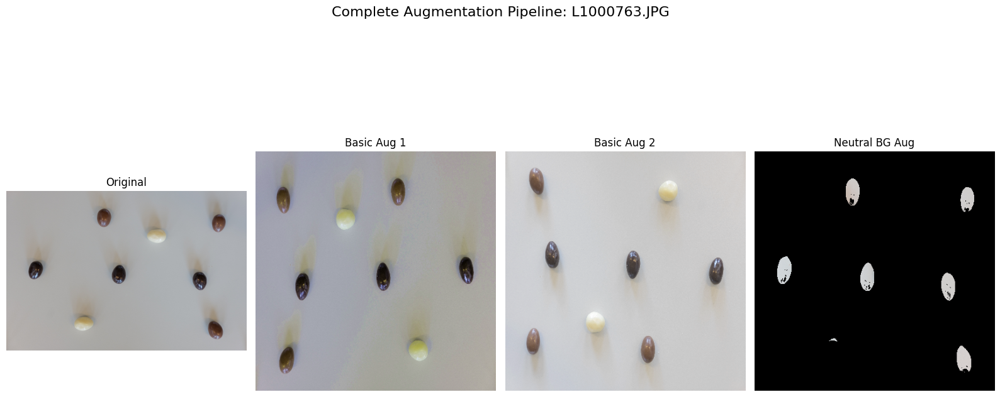

Generated 4 variations for image with neutral background


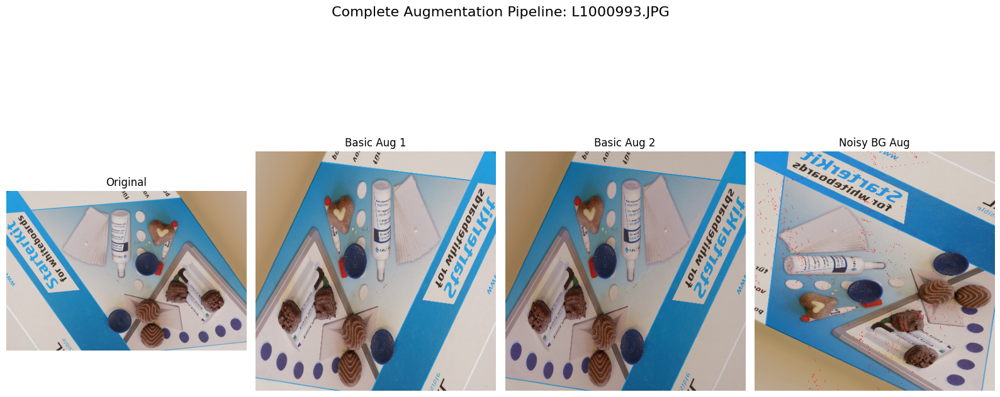

Generated 4 variations for image with noisy background


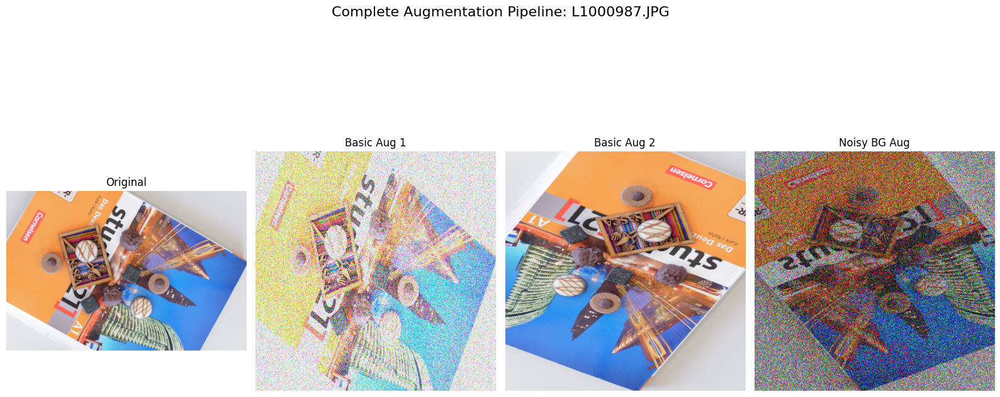

Generated 4 variations for image with noisy background


In [11]:
import albumentations as A
from tensorflow.keras.utils import Sequence
import random

def create_augmentation_pipeline():
    """
    Create two augmentation pipelines:
    1. Basic augmentations for all images
    2. Background-specific augmentations
    """
    # Basic augmentation pipeline for all images
    basic_transforms = A.Compose([
        A.RandomRotate90(p=0.5),
        A.HorizontalFlip(p=0.5),
        A.VerticalFlip(p=0.3),
        A.RandomBrightnessContrast(brightness_limit=0.2, contrast_limit=0.2, p=0.7),
        A.HueSaturationValue(hue_shift_limit=10, sat_shift_limit=15, val_shift_limit=10, p=0.5),
        A.GaussNoise(var_limit=(10.0, 50.0), p=0.3),
        A.Resize(height=416, width=416)  # Resize for model input
    ])
    
    return basic_transforms

def process_and_augment_images(image_paths, num_samples=5):
    """
    Demonstrate the complete augmentation pipeline with background-aware processing
    """
    # Get basic augmentations
    augmenter = create_augmentation_pipeline()
    
    # Process sample images
    samples = image_paths[:num_samples]
    
    for img_path in samples:
        img = cv2.imread(img_path)
        if img is None:
            continue
            
        # Convert to RGB
        rgb_img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        
        # Determine background type
        gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
        background_type = classify_background(gray)
        
        # Create multiple augmented versions
        augmented_images = []
        aug_titles = []
        
        # Original image
        augmented_images.append(rgb_img)
        aug_titles.append("Original")
        
        # Apply basic augmentations
        for i in range(2):  # Create 2 basic augmentations
            augmented = augmenter(image=rgb_img)['image']
            augmented_images.append(augmented)
            aug_titles.append(f"Basic Aug {i+1}")
        
        # Apply background-aware processing + augmentation
        if background_type == "neutral":
            # Apply Gaussian blur and Otsu's thresholding
            blurred = cv2.GaussianBlur(gray, (5, 5), 0)
            _, otsu_thresh = cv2.threshold(blurred, 0, 255, 
                                          cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)
            
            # Get an augmented base image
            aug_with_bg = augmenter(image=rgb_img)['image']
            
            # Resize the threshold mask to match the augmented image dimensions
            otsu_thresh_resized = cv2.resize(otsu_thresh, (aug_with_bg.shape[1], aug_with_bg.shape[0]), 
                                            interpolation=cv2.INTER_NEAREST)
            
            # Apply mask properly - create a binary mask where 1=foreground, 0=background
            mask = (otsu_thresh_resized > 0).astype(np.uint8)
            
            # Apply mask to each channel
            bg_aware_aug = aug_with_bg.copy()
            bg_aware_aug[:,:,0] = bg_aware_aug[:,:,0] * mask  # Red channel
            bg_aware_aug[:,:,1] = bg_aware_aug[:,:,1] * mask  # Green channel
            bg_aware_aug[:,:,2] = bg_aware_aug[:,:,2] * mask  # Blue channel
            
            augmented_images.append(bg_aware_aug)
            aug_titles.append("Neutral BG Aug")
            
        else:  # noisy background
            # Apply Gaussian blur + Canny edge detection
            blurred = cv2.GaussianBlur(gray, (5, 5), 0)
            edges = cv2.Canny(blurred, 50, 150)
            
            # Get an augmented base image
            aug_with_bg = augmenter(image=rgb_img)['image']
            
            # Resize edges to match the augmented image dimensions
            edges_resized = cv2.resize(edges, (aug_with_bg.shape[1], aug_with_bg.shape[0]), 
                                      interpolation=cv2.INTER_NEAREST)
            
            # Create a mask from edges
            edge_mask = (edges_resized > 0).astype(np.uint8)
            
            # Highlight edges in red using the mask
            edge_overlay = aug_with_bg.copy()
            edge_overlay[:,:,0][edge_mask > 0] = 255  # Set red channel to max where edges exist
            edge_overlay[:,:,1][edge_mask > 0] = 0    # Set green channel to 0 where edges exist
            edge_overlay[:,:,2][edge_mask > 0] = 0    # Set blue channel to 0 where edges exist
            
            augmented_images.append(edge_overlay)
            aug_titles.append("Noisy BG Aug")
        
        # Display results
        plt.figure(figsize=(16, 8))
        plt.suptitle(f"Complete Augmentation Pipeline: {os.path.basename(img_path)}", fontsize=16)
        
        cols = len(augmented_images)
        for i, (aug_img, title) in enumerate(zip(augmented_images, aug_titles)):
            plt.subplot(1, cols, i+1)
            plt.imshow(aug_img)
            plt.title(title)
            plt.axis('off')
        
        plt.tight_layout(rect=[0, 0, 1, 0.95])
        plt.show()
        
        print(f"Generated {len(augmented_images)} variations for image with {background_type} background")

# Helper function to classify backgrounds (reusing from previous step)
def classify_background(gray_img):
    # Calculate variance of pixel values
    variance = np.var(gray_img)
    
    # Calculate number of edges
    edges = cv2.Canny(gray_img, 50, 150)
    edge_percentage = np.count_nonzero(edges) / edges.size
    
    # Simple heuristic: if variance is low and there are few edges, likely neutral background
    is_neutral = variance < 1500 and edge_percentage < 0.05
    
    return "neutral" if is_neutral else "noisy"


import albumentations
if image_paths:
    process_and_augment_images(image_paths)

Loaded annotations for 90 images
Chocolate types: ['Jelly White', 'Jelly Milk', 'Jelly Black', 'Amandina', 'Crème brulée', 'Triangolo', 'Tentation noir', 'Comtesse', 'Noblesse', 'Noir authentique', 'Passion au lait', 'Arabia', 'Stracciatella']


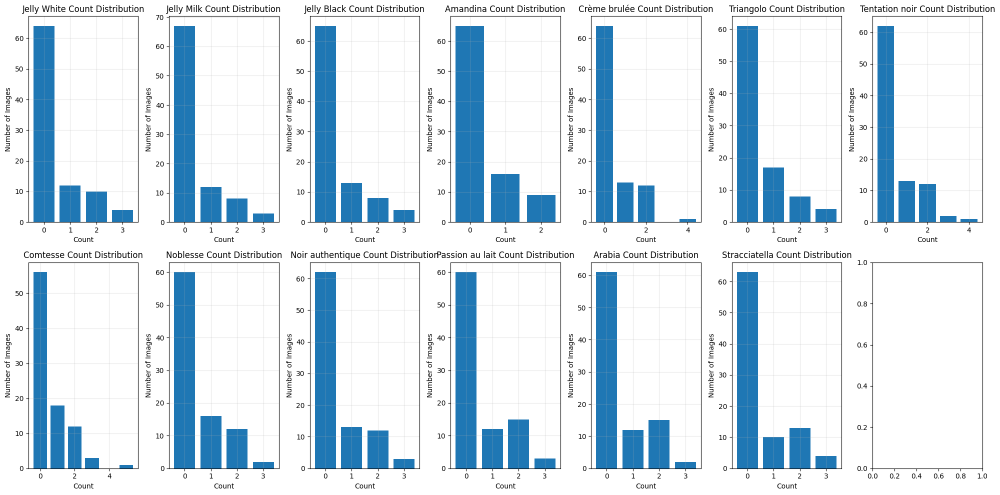

First few extracted image IDs: ['1010014', '1000788', '1000763', '1000993', '1000987']
First few annotation IDs: ['1000756', '1000763', '1000765', '1000768', '1000772']
Found 6 valid matches out of 6 images
Found 6 images with annotations
Chocolate types: ['Jelly White', 'Jelly Milk', 'Jelly Black', 'Amandina', 'Crème brulée', 'Triangolo', 'Tentation noir', 'Comtesse', 'Noblesse', 'Noir authentique', 'Passion au lait', 'Arabia', 'Stracciatella']
Testing data generator with 3 batches of size 2


/var/folders/cb/xf0sm7hn1r96833t6t05mrz40000gq/T/ipykernel_39352/2846603730.py:18: UserWarning: Argument(s) 'var_limit' are not valid for transform GaussNoise
  A.GaussNoise(var_limit=(10.0, 50.0), p=0.3),


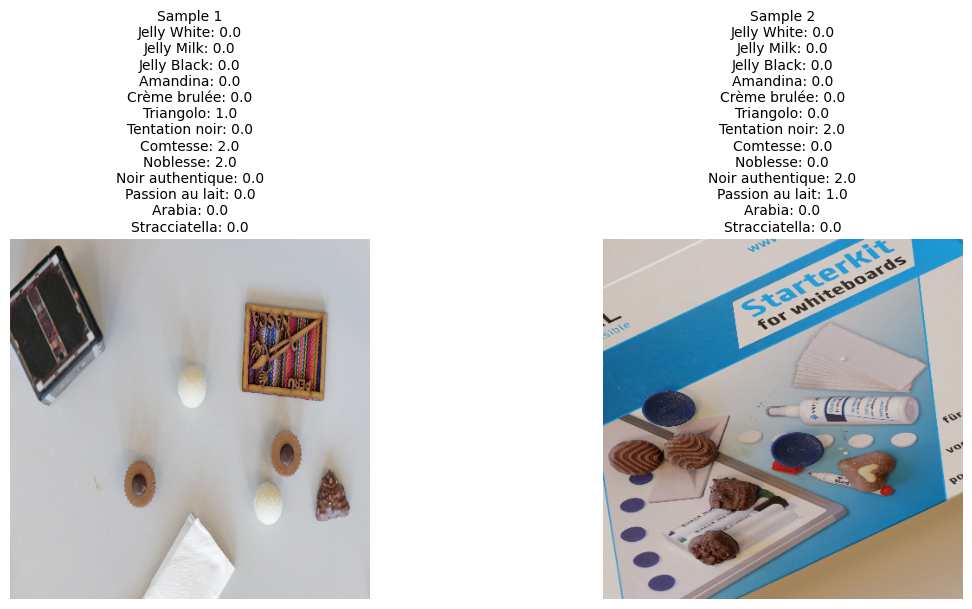


Data generator is ready for model training


In [23]:
import pandas as pd

class ChocolateCountDataGenerator(tf.keras.utils.Sequence):
    """
    Data generator for chocolate count prediction model.
    Loads images and count annotations from CSV, applies augmentations.
    """
    def __init__(self, image_paths, annotation_csv, batch_size=8, 
             input_size=(416, 416), shuffle=True, augment=True):
        """
        Initialize the data generator.
        
        Args:
            image_paths: List of paths to images
            annotation_csv: Path to CSV file with chocolate counts
            batch_size: Number of images per batch
            input_size: Model input image size (height, width)
            shuffle: Whether to shuffle data between epochs
            augment: Whether to apply augmentation
        """
        self.image_paths = image_paths
        self.input_size = input_size
        self.batch_size = batch_size
        self.shuffle = shuffle
        self.augment = augment
        
        # Load annotations from CSV
        self.annotations_df = pd.read_csv(annotation_csv)
        
        # Extract image IDs from filenames
        self.image_ids = [self._extract_id_from_path(path) for path in image_paths]
        
        # Convert IDs in annotations to strings for consistent comparison
        self.annotations_df['id'] = self.annotations_df['id'].astype(str)
        
        # Print first few image IDs to debug
        print(f"First few extracted image IDs: {self.image_ids[:5]}")
        print(f"First few annotation IDs: {self.annotations_df['id'].head().tolist()}")
        
        # Filter out images that don't have annotations
        valid_indices = []
        for i, img_id in enumerate(self.image_ids):
            if img_id in self.annotations_df['id'].values:
                valid_indices.append(i)
        
        # Show how many valid matches we found
        print(f"Found {len(valid_indices)} valid matches out of {len(image_paths)} images")
        
        self.image_paths = [self.image_paths[i] for i in valid_indices]
        self.image_ids = [self.image_ids[i] for i in valid_indices]
        
        # Get chocolate types (column names excluding 'id')
        self.chocolate_types = [col for col in self.annotations_df.columns if col != 'id']
        self.num_classes = len(self.chocolate_types)
        
        print(f"Found {len(self.image_paths)} images with annotations")
        print(f"Chocolate types: {self.chocolate_types}")
        
        # Create augmentation pipeline
        self.basic_augmenter = create_augmentation_pipeline()
        
        # Create indices and shuffle if needed
        self.indices = np.arange(len(self.image_paths))
        if self.shuffle:
            np.random.shuffle(self.indices)
    
    # def _extract_id_from_path(self, path):
    #     """Extract image ID from file path"""
    #     # Assuming filename format like 'L1000817.JPG'
    #     filename = os.path.basename(path)
    #     # Remove L prefix if present and extension
    #     img_id = filename.replace('L', '').split('.')[0]
    #     return img_id
    def _extract_id_from_path(self, path):
        """Extract image ID from file path"""
        filename = os.path.basename(path)
        # Remove L prefix if present and extension
        if filename.startswith('L'):
            img_id = filename[1:].split('.')[0]  # Remove 'L' from the beginning
        else:
            img_id = filename.split('.')[0]
        return img_id
    
    def __len__(self):
        """Return the number of batches per epoch"""
        return int(np.ceil(len(self.image_paths) / self.batch_size))
    
    def __getitem__(self, idx):
        """
        Get a batch of data for the given index
        
        Args:
            idx: Batch index
            
        Returns:
            Tuple of (images, targets) where targets contains chocolate counts
        """
        # Get batch indices
        batch_indices = self.indices[idx * self.batch_size:
                                     min((idx + 1) * self.batch_size, len(self.image_paths))]
        
        # Initialize batch arrays
        batch_size = len(batch_indices)
        batch_images = np.zeros((batch_size, *self.input_size, 3), dtype=np.float32)
        batch_targets = np.zeros((batch_size, self.num_classes), dtype=np.float32)
        
        # Loop through batch indices
        for i, idx in enumerate(batch_indices):
            # Get image path and ID
            img_path = self.image_paths[idx]
            img_id = self.image_ids[idx]
            
            # Load image
            img = cv2.imread(img_path)
            if img is None:
                continue
                
            # Convert to RGB
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
            
            # Get chocolate counts for this image
            annotation_row = self.annotations_df[self.annotations_df['id'] == img_id].iloc[0]
            counts = [annotation_row[choc_type] for choc_type in self.chocolate_types]
            
            # Apply background-aware augmentation if enabled
            if self.augment:
                gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
                background_type = classify_background(gray)
                
                # Apply basic augmentations
                transformed = self.basic_augmenter(image=img)
                img = transformed['image']
                
                # Apply background-specific processing (optional)
                if background_type == "neutral":
                    # For neutral backgrounds, you might want to apply additional processing
                    # This shouldn't change the counts, just help with feature learning
                    pass
                else:
                    # For noisy backgrounds, apply appropriate processing
                    pass
            else:
                # Just resize the image if no augmentation
                img = cv2.resize(img, self.input_size[:2][::-1])
            
            # Normalize pixel values to [0, 1]
            img = img.astype(np.float32) / 255.0
            
            # Store in batch arrays
            batch_images[i] = img
            batch_targets[i] = counts
        
        return batch_images, batch_targets
    
    def on_epoch_end(self):
        """Shuffle indices after each epoch if shuffle is enabled"""
        if self.shuffle:
            np.random.shuffle(self.indices)

def load_annotations_from_csv(csv_path):
    """
    Load chocolate count annotations from CSV file
    
    Args:
        csv_path: Path to CSV file with format id,Type1,Type2,...
        
    Returns:
        DataFrame with chocolate counts for each image
    """
    try:
        df = pd.read_csv(csv_path)
        print(f"Loaded annotations for {len(df)} images")
        print(f"Chocolate types: {list(df.columns)[1:]}")
        return df
    except Exception as e:
        print(f"Error loading annotations: {e}")
        return None

def visualize_count_distribution(annotations_df):
    """
    Visualize the distribution of chocolate counts in the dataset
    
    Args:
        annotations_df: DataFrame with chocolate counts
    """
    # Get chocolate types (columns excluding 'id')
    chocolate_types = [col for col in annotations_df.columns if col != 'id']
    
    # Create a figure with subplots
    fig, axes = plt.subplots(nrows=2, ncols=len(chocolate_types)//2 + len(chocolate_types)%2, 
                          figsize=(20, 10))
    axes = axes.flatten()
    
    # Plot count distribution for each chocolate type
    for i, choc_type in enumerate(chocolate_types):
        counts = annotations_df[choc_type].value_counts().sort_index()
        axes[i].bar(counts.index, counts.values)
        axes[i].set_title(f'{choc_type} Count Distribution')
        axes[i].set_xlabel('Count')
        axes[i].set_ylabel('Number of Images')
        axes[i].grid(alpha=0.3)
    
    plt.tight_layout()
    plt.show()

# Test the data generator with the CSV file
# Load annotations
csv_path = '/Users/sherwood/Desktop/study/EPFL/IM/project/dataset_project_iapr2025/train.csv'  # Update with your CSV path
annotations = load_annotations_from_csv(csv_path)

if annotations is not None:
    # Visualize count distribution
    visualize_count_distribution(annotations)
    
    # Create and test the data generator
    if 'image_paths' in globals() and len(image_paths) > 0:
        mini_batch_size = 2
        test_generator = ChocolateCountDataGenerator(
            image_paths=image_paths[:6],
            annotation_csv=csv_path,
            batch_size=mini_batch_size,
            input_size=(416, 416),
            shuffle=True,
            augment=True
        )
        
        # Get a batch
        print(f"Testing data generator with {len(test_generator)} batches of size {mini_batch_size}")
        images, counts = test_generator[0]
        
        # Display a sample from the batch with its counts
        plt.figure(figsize=(12, 6))
        
        for i in range(min(2, len(images))):
            plt.subplot(1, 2, i+1)
            plt.imshow(images[i])
            
            # Format count information as a string
            count_str = "\n".join([f"{test_generator.chocolate_types[j]}: {counts[i][j]}" 
                                    for j in range(len(test_generator.chocolate_types))])
            
            plt.title(f"Sample {i+1}\n{count_str}", fontsize=10)
            plt.axis('off')
        
        plt.tight_layout()
        plt.show()
        
        print("\nData generator is ready for model training")
    else:
        print("No sample images available to test the data generator")

In [24]:
def create_chocolate_counting_model(input_shape=(416, 416, 3), num_chocolate_types=None):
    """
    Create a CNN model for counting chocolates in images.
    
    Args:
        input_shape: Input image dimensions (height, width, channels)
        num_chocolate_types: Number of chocolate types to count
        
    Returns:
        A Keras model for chocolate counting
    """
    # Define input layer
    inputs = layers.Input(shape=input_shape)
    
    # Feature extraction backbone - using a simpler architecture than before
    # Block 1
    x = layers.Conv2D(32, (3, 3), padding='same', activation='relu', kernel_regularizer=regularizers.l2(0.0005))(inputs)
    x = layers.BatchNormalization()(x)
    x = layers.MaxPooling2D(pool_size=(2, 2))(x)
    
    # Block 2
    x = layers.Conv2D(64, (3, 3), padding='same', activation='relu', kernel_regularizer=regularizers.l2(0.0005))(x)
    x = layers.BatchNormalization()(x)
    x = layers.MaxPooling2D(pool_size=(2, 2))(x)
    
    # Block 3
    x = layers.Conv2D(128, (3, 3), padding='same', activation='relu', kernel_regularizer=regularizers.l2(0.0005))(x)
    x = layers.BatchNormalization()(x)
    x = layers.Conv2D(64, (1, 1), padding='same', activation='relu', kernel_regularizer=regularizers.l2(0.0005))(x)
    x = layers.BatchNormalization()(x)
    x = layers.Conv2D(128, (3, 3), padding='same', activation='relu', kernel_regularizer=regularizers.l2(0.0005))(x)
    x = layers.BatchNormalization()(x)
    x = layers.MaxPooling2D(pool_size=(2, 2))(x)
    
    # Block 4
    x = layers.Conv2D(256, (3, 3), padding='same', activation='relu', kernel_regularizer=regularizers.l2(0.0005))(x)
    x = layers.BatchNormalization()(x)
    x = layers.Conv2D(128, (1, 1), padding='same', activation='relu', kernel_regularizer=regularizers.l2(0.0005))(x)
    x = layers.BatchNormalization()(x)
    x = layers.Conv2D(256, (3, 3), padding='same', activation='relu', kernel_regularizer=regularizers.l2(0.0005))(x)
    x = layers.BatchNormalization()(x)
    
    # Global features with attention
    attention = layers.Conv2D(1, (1, 1), padding='same', activation='sigmoid')(x)
    x = layers.Multiply()([x, attention])
    
    # Global pooling to aggregate features from the entire image
    x = layers.GlobalAveragePooling2D()(x)
    
    # Fully connected layers with dropout for regularization
    x = layers.Dense(256, activation='relu', kernel_regularizer=regularizers.l2(0.0005))(x)
    x = layers.Dropout(0.5)(x)
    x = layers.Dense(128, activation='relu', kernel_regularizer=regularizers.l2(0.0005))(x)
    x = layers.Dropout(0.5)(x)
    
    # Output layer - one neuron per chocolate type (regression)
    outputs = layers.Dense(num_chocolate_types, activation='relu', name='count_output')(x)
    
    # Create model
    model = models.Model(inputs=inputs, outputs=outputs, name='chocolate_counter')
    
    # Compile model with appropriate loss and metrics
    model.compile(
        optimizer=tf.keras.optimizers.Adam(learning_rate=0.001),
        loss='mean_squared_error',
        metrics=['mae', 'mse']  # Mean absolute error and mean squared error
    )
    
    return model

def train_chocolate_counting_model(train_generator, validation_generator=None, 
                                  epochs=50, initial_epoch=0, callbacks=None):
    """
    Train the chocolate counting model.
    
    Args:
        train_generator: Generator for training data
        validation_generator: Generator for validation data (optional)
        epochs: Number of epochs to train
        initial_epoch: Starting epoch (useful for resuming training)
        callbacks: List of Keras callbacks
        
    Returns:
        Training history
    """
    # Create model
    num_chocolate_types = train_generator.num_classes
    model = create_chocolate_counting_model(
        input_shape=(416, 416, 3),
        num_chocolate_types=num_chocolate_types
    )
    
    # Display model summary
    model.summary()
    
    # Define default callbacks if none are provided
    if callbacks is None:
        callbacks = [
            tf.keras.callbacks.ModelCheckpoint(
                filepath='chocolate_counter_best.h5',
                monitor='val_loss' if validation_generator else 'loss',
                save_best_only=True,
                save_weights_only=False,
                verbose=1
            ),
            tf.keras.callbacks.ReduceLROnPlateau(
                monitor='val_loss' if validation_generator else 'loss',
                factor=0.5,
                patience=5,
                verbose=1
            ),
            tf.keras.callbacks.EarlyStopping(
                monitor='val_loss' if validation_generator else 'loss',
                patience=15,
                verbose=1,
                restore_best_weights=True
            )
        ]
    
    # Train the model
    history = model.fit(
        train_generator,
        validation_data=validation_generator,
        epochs=epochs,
        initial_epoch=initial_epoch,
        callbacks=callbacks,
        verbose=1
    )
    
    # Save the final model
    model.save('chocolate_counter_final.h5')
    
    return model, history

# Custom metric: Mean Absolute Percentage Error per class
def mean_absolute_percentage_error_per_class(y_true, y_pred):
    """
    Calculate MAPE for each chocolate type separately
    
    Args:
        y_true: Ground truth labels
        y_pred: Predicted values
        
    Returns:
        Dictionary of MAPE values for each chocolate type
    """
    class_mapes = {}
    
    for i, class_name in enumerate(chocolate_types):
        # Avoid division by zero - only consider non-zero ground truth values
        non_zero_mask = tf.cast(y_true[:, i] > 0, tf.float32)
        count_non_zero = tf.reduce_sum(non_zero_mask)
        
        if count_non_zero > 0:
            # Calculate absolute percentage error
            mape = tf.reduce_sum(
                non_zero_mask * 
                tf.abs((y_true[:, i] - y_pred[:, i]) / tf.maximum(y_true[:, i], 1e-7))
            ) / count_non_zero * 100.0
            class_mapes[class_name] = mape
            
    return class_mapes

# Function to evaluate model on test data
def evaluate_chocolate_counter(model, test_generator):
    """
    Evaluate the chocolate counting model on test data
    
    Args:
        model: Trained model
        test_generator: Data generator for test set
        
    Returns:
        Evaluation metrics
    """
    # Get all test data
    all_images = []
    all_true_counts = []
    
    for i in range(len(test_generator)):
        images, true_counts = test_generator[i]
        all_images.append(images)
        all_true_counts.append(true_counts)
    
    all_images = np.vstack(all_images)
    all_true_counts = np.vstack(all_true_counts)
    
    # Make predictions
    predicted_counts = model.predict(all_images)
    
    # Round predictions to nearest integer
    predicted_counts_rounded = np.round(predicted_counts).astype(int)
    
    # Calculate metrics
    metrics = {}
    metrics['mse'] = np.mean((all_true_counts - predicted_counts) ** 2)
    metrics['mae'] = np.mean(np.abs(all_true_counts - predicted_counts))
    
    # Per-class metrics
    for i, choc_type in enumerate(test_generator.chocolate_types):
        true_class = all_true_counts[:, i]
        pred_class = predicted_counts[:, i]
        pred_class_rounded = predicted_counts_rounded[:, i]
        
        # Only consider samples where this chocolate type is present
        present_mask = true_class > 0
        if np.sum(present_mask) > 0:
            metrics[f'{choc_type}_mae'] = np.mean(np.abs(true_class[present_mask] - pred_class[present_mask]))
            metrics[f'{choc_type}_mape'] = np.mean(
                np.abs((true_class[present_mask] - pred_class[present_mask]) / true_class[present_mask])
            ) * 100.0
            
            # Accuracy (exact match after rounding)
            metrics[f'{choc_type}_accuracy'] = np.mean(true_class == pred_class_rounded)
    
    # Visualize results
    plt.figure(figsize=(15, 10))
    
    for i, choc_type in enumerate(test_generator.chocolate_types):
        plt.subplot(len(test_generator.chocolate_types), 1, i+1)
        plt.scatter(all_true_counts[:, i], predicted_counts[:, i], alpha=0.5)
        plt.plot([0, np.max(all_true_counts[:, i])], [0, np.max(all_true_counts[:, i])], 'r--')
        plt.xlabel(f'True Count ({choc_type})')
        plt.ylabel('Predicted Count')
        plt.title(f'{choc_type}: MAE={metrics[f"{choc_type}_mae"]:.2f}, MAPE={metrics[f"{choc_type}_mape"]:.2f}%')
        plt.grid(alpha=0.3)
    
    plt.tight_layout()
    plt.show()
    
    return metrics

# Test model creation
try:
    if 'test_generator' in globals() and hasattr(test_generator, 'num_classes'):
        # Create a model with the right number of outputs
        sample_model = create_chocolate_counting_model(
            input_shape=(416, 416, 3),
            num_chocolate_types=test_generator.num_classes
        )
        
        # Display model summary
        print("Chocolate Counting Model Architecture:")
        sample_model.summary()
        
        # Optionally visualize model architecture
        try:
            from tensorflow.keras.utils import plot_model
            plot_model(sample_model, to_file='chocolate_counting_model.png', 
                     show_shapes=True, show_layer_names=True)
            display(Image('chocolate_counting_model.png'))
        except:
            print("Could not generate model visualization, but model was created successfully.")
        
        print("\nModel is ready for training. Use train_chocolate_counting_model() function to train the model.")
    else:
        print("Could not create sample model - data generator not properly initialized.")
        
except Exception as e:
    print(f"Error creating model: {e}")

Chocolate Counting Model Architecture:


Model: "chocolate_counter"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_4       │ (None, 416, 416,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_52 (Conv2D)  │ (None, 416, 416,  │        896 │ input_layer_4[0]… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 416, 416,  │        128 │ conv2d_52[0][0]   │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_14    │ (None, 208, 208,  │          0 │ batch_normalizat… │
│ (MaxPooling2D)      │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_53 (Conv2D)  │ (None, 208, 208,  │     18,496 │ max_pooling2d_14… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 208, 208,  │        256 │ conv2d_53[0][0]   │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_15    │ (None, 104, 104,  │          0 │ batch_normalizat… │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_54 (Conv2D)  │ (None, 104, 104,  │     73,856 │ max_pooling2d_15… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 104, 104,  │        512 │ conv2d_54[0][0]   │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_55 (Conv2D)  │ (None, 104, 104,  │      8,256 │ batch_normalizat… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 104, 104,  │        256 │ conv2d_55[0][0]   │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_56 (Conv2D)  │ (None, 104, 104,  │     73,856 │ batch_normalizat… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 104, 104,  │        512 │ conv2d_56[0][0]   │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_16    │ (None, 52, 52,    │          0 │ batch_normalizat… │
│ (MaxPooling2D)      │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_57 (Conv2D)  │ (None, 52, 52,    │    295,168 │ max_pooling2d_16… │
│                     │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 52, 52,    │      1,024 │ conv2d_57[0][0]   │
│ (BatchNormalizatio… │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_58 (Conv2D)  │ (None, 52, 52,    │     32,896 │ batch_normalizat

 Total params: 903,438 (3.45 MB)

 Trainable params: 901,326 (3.44 MB)

 Non-trainable params: 2,112 (8.25 KB)

You must install pydot (`pip install pydot`) for `plot_model` to work.
Could not generate model visualization, but model was created successfully.

Model is ready for training. Use train_chocolate_counting_model() function to train the model.


Loaded annotations for 90 images
Sample IDs from annotations file: ['1000756', '1000763', '1000765', '1000768', '1000772']
Found 90 image files in directory
Sample filenames: ['L1010014.JPG', 'L1000788.JPG', 'L1000763.JPG', 'L1000993.JPG', 'L1000987.JPG']
Processing L1010014.JPG -> extracted ID: '1010014'
  Is in annotations: True
Processing L1000788.JPG -> extracted ID: '1000788'
  Is in annotations: True
Processing L1000763.JPG -> extracted ID: '1000763'
  Is in annotations: True
Processing L1000993.JPG -> extracted ID: '1000993'
  Is in annotations: True
Processing L1000987.JPG -> extracted ID: '1000987'
  Is in annotations: True
Found 90 images with matching annotations
Split data into 67 training, 14 validation, and 9 test images
First few extracted image IDs: ['1000788', '1000894', '1000974', '1000909', '1000797']
First few annotation IDs: ['1000756', '1000763', '1000765', '1000768', '1000772']
Found 67 valid matches out of 67 images
Found 67 images with annotations
Chocolate typ

/var/folders/cb/xf0sm7hn1r96833t6t05mrz40000gq/T/ipykernel_39352/2846603730.py:18: UserWarning: Argument(s) 'var_limit' are not valid for transform GaussNoise
  A.GaussNoise(var_limit=(10.0, 50.0), p=0.3),
/var/folders/cb/xf0sm7hn1r96833t6t05mrz40000gq/T/ipykernel_39352/2846603730.py:18: UserWarning: Argument(s) 'var_limit' are not valid for transform GaussNoise
  A.GaussNoise(var_limit=(10.0, 50.0), p=0.3),
/var/folders/cb/xf0sm7hn1r96833t6t05mrz40000gq/T/ipykernel_39352/2846603730.py:18: UserWarning: Argument(s) 'var_limit' are not valid for transform GaussNoise
  A.GaussNoise(var_limit=(10.0, 50.0), p=0.3),


Model: "chocolate_counter"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_5       │ (None, 416, 416,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_61 (Conv2D)  │ (None, 416, 416,  │        896 │ input_layer_5[0]… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 416, 416,  │        128 │ conv2d_61[0][0]   │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_17    │ (None, 208, 208,  │          0 │ batch_normalizat… │
│ (MaxPooling2D)      │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_62 (Conv2D)  │ (None, 208, 208,  │     18,496 │ max_pooling2d_17… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 208, 208,  │        256 │ conv2d_62[0][0]   │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_18    │ (None, 104, 104,  │          0 │ batch_normalizat… │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_63 (Conv2D)  │ (None, 104, 104,  │     73,856 │ max_pooling2d_18… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 104, 104,  │        512 │ conv2d_63[0][0]   │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_64 (Conv2D)  │ (None, 104, 104,  │      8,256 │ batch_normalizat… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 104, 104,  │        256 │ conv2d_64[0][0]   │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_65 (Conv2D)  │ (None, 104, 104,  │     73,856 │ batch_normalizat… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 104, 104,  │        512 │ conv2d_65[0][0]   │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_19    │ (None, 52, 52,    │          0 │ batch_normalizat… │
│ (MaxPooling2D)      │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_66 (Conv2D)  │ (None, 52, 52,    │    295,168 │ max_pooling2d_19… │
│                     │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 52, 52,    │      1,024 │ conv2d_66[0][0]   │
│ (BatchNormalizatio… │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_67 (Conv2D)  │ (None, 52, 52,    │     32,896 │ batch_normalizat

 Total params: 903,438 (3.45 MB)

 Trainable params: 901,326 (3.44 MB)

 Non-trainable params: 2,112 (8.25 KB)

/opt/anaconda3/envs/iapr/lib/python3.9/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/50
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - loss: 1.5349 - mae: 0.5693 - mse: 0.9151
Epoch 1: val_loss improved from inf to 1.47742, saving model to chocolate_counter_models/choc_counter_20250504-230613_best.h5


9/9 ━━━━━━━━━━━━━━━━━━━━ 34s 3s/step - loss: 1.5359 - mae: 0.5700 - mse: 0.9162 - val_loss: 1.4774 - val_mae: 0.4860 - val_mse: 0.8605 - learning_rate: 0.0010
Epoch 2/50
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - loss: 1.5886 - mae: 0.6231 - mse: 0.9716
Epoch 2: val_loss improved from 1.47742 to 1.47097, saving model to chocolate_counter_models/choc_counter_20250504-230613_best.h5


9/9 ━━━━━━━━━━━━━━━━━━━━ 27s 3s/step - loss: 1.5830 - mae: 0.6197 - mse: 0.9660 - val_loss: 1.4710 - val_mae: 0.4918 - val_mse: 0.8537 - learning_rate: 0.0010
Epoch 3/50
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - loss: 1.4916 - mae: 0.5726 - mse: 0.8743
Epoch 3: val_loss improved from 1.47097 to 1.46334, saving model to chocolate_counter_models/choc_counter_20250504-230613_best.h5


9/9 ━━━━━━━━━━━━━━━━━━━━ 28s 3s/step - loss: 1.4927 - mae: 0.5718 - mse: 0.8755 - val_loss: 1.4633 - val_mae: 0.4921 - val_mse: 0.8464 - learning_rate: 0.0010
Epoch 4/50
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - loss: 1.5027 - mae: 0.5756 - mse: 0.8861
Epoch 4: val_loss improved from 1.46334 to 1.44741, saving model to chocolate_counter_models/choc_counter_20250504-230613_best.h5


9/9 ━━━━━━━━━━━━━━━━━━━━ 30s 3s/step - loss: 1.5056 - mae: 0.5755 - mse: 0.8890 - val_loss: 1.4474 - val_mae: 0.5010 - val_mse: 0.8322 - learning_rate: 0.0010
Epoch 5/50
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - loss: 1.4870 - mae: 0.5722 - mse: 0.8723
Epoch 5: val_loss improved from 1.44741 to 1.42946, saving model to chocolate_counter_models/choc_counter_20250504-230613_best.h5


9/9 ━━━━━━━━━━━━━━━━━━━━ 26s 3s/step - loss: 1.4891 - mae: 0.5725 - mse: 0.8744 - val_loss: 1.4295 - val_mae: 0.5108 - val_mse: 0.8168 - learning_rate: 0.0010
Epoch 6/50
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - loss: 1.4907 - mae: 0.5638 - mse: 0.8787
Epoch 6: val_loss did not improve from 1.42946
9/9 ━━━━━━━━━━━━━━━━━━━━ 28s 3s/step - loss: 1.4882 - mae: 0.5641 - mse: 0.8762 - val_loss: 1.4506 - val_mae: 0.4960 - val_mse: 0.8409 - learning_rate: 0.0010
Epoch 7/50
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - loss: 1.5237 - mae: 0.5870 - mse: 0.9148
Epoch 7: val_loss improved from 1.42946 to 1.41836, saving model to chocolate_counter_models/choc_counter_20250504-230613_best.h5


9/9 ━━━━━━━━━━━━━━━━━━━━ 28s 3s/step - loss: 1.5239 - mae: 0.5883 - mse: 0.9151 - val_loss: 1.4184 - val_mae: 0.5174 - val_mse: 0.8121 - learning_rate: 0.0010
Epoch 8/50
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - loss: 1.5203 - mae: 0.5820 - mse: 0.9149
Epoch 8: val_loss improved from 1.41836 to 1.41260, saving model to chocolate_counter_models/choc_counter_20250504-230613_best.h5


9/9 ━━━━━━━━━━━━━━━━━━━━ 29s 3s/step - loss: 1.5133 - mae: 0.5811 - mse: 0.9079 - val_loss: 1.4126 - val_mae: 0.5130 - val_mse: 0.8100 - learning_rate: 0.0010
Epoch 9/50
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - loss: 1.4503 - mae: 0.5895 - mse: 0.8486
Epoch 9: val_loss did not improve from 1.41260
9/9 ━━━━━━━━━━━━━━━━━━━━ 33s 4s/step - loss: 1.4527 - mae: 0.5899 - mse: 0.8510 - val_loss: 1.4144 - val_mae: 0.5135 - val_mse: 0.8157 - learning_rate: 0.0010
Epoch 10/50
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - loss: 1.4556 - mae: 0.6207 - mse: 0.8578
Epoch 10: val_loss improved from 1.41260 to 1.41127, saving model to chocolate_counter_models/choc_counter_20250504-230613_best.h5


9/9 ━━━━━━━━━━━━━━━━━━━━ 28s 3s/step - loss: 1.4519 - mae: 0.6185 - mse: 0.8543 - val_loss: 1.4113 - val_mae: 0.5149 - val_mse: 0.8169 - learning_rate: 0.0010
Epoch 11/50
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - loss: 1.4562 - mae: 0.5911 - mse: 0.8629
Epoch 11: val_loss improved from 1.41127 to 1.39851, saving model to chocolate_counter_models/choc_counter_20250504-230613_best.h5


9/9 ━━━━━━━━━━━━━━━━━━━━ 29s 3s/step - loss: 1.4536 - mae: 0.5916 - mse: 0.8603 - val_loss: 1.3985 - val_mae: 0.5180 - val_mse: 0.8087 - learning_rate: 0.0010
Epoch 12/50
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - loss: 1.4942 - mae: 0.6273 - mse: 0.9055
Epoch 12: val_loss improved from 1.39851 to 1.36637, saving model to chocolate_counter_models/choc_counter_20250504-230613_best.h5


9/9 ━━━━━━━━━━━━━━━━━━━━ 27s 3s/step - loss: 1.4875 - mae: 0.6263 - mse: 0.8990 - val_loss: 1.3664 - val_mae: 0.5413 - val_mse: 0.7811 - learning_rate: 0.0010
Epoch 13/50
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - loss: 1.3117 - mae: 0.5786 - mse: 0.7275
Epoch 13: val_loss did not improve from 1.36637
9/9 ━━━━━━━━━━━━━━━━━━━━ 31s 3s/step - loss: 1.3176 - mae: 0.5814 - mse: 0.7334 - val_loss: 1.4300 - val_mae: 0.7634 - val_mse: 0.8493 - learning_rate: 0.0010
Epoch 14/50
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - loss: 1.3662 - mae: 0.6065 - mse: 0.7865
Epoch 14: val_loss improved from 1.36637 to 1.31090, saving model to chocolate_counter_models/choc_counter_20250504-230613_best.h5


9/9 ━━━━━━━━━━━━━━━━━━━━ 29s 3s/step - loss: 1.3684 - mae: 0.6067 - mse: 0.7889 - val_loss: 1.3109 - val_mae: 0.6043 - val_mse: 0.7349 - learning_rate: 0.0010
Epoch 15/50
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - loss: 1.4415 - mae: 0.6226 - mse: 0.8665
Epoch 15: val_loss did not improve from 1.31090
9/9 ━━━━━━━━━━━━━━━━━━━━ 29s 3s/step - loss: 1.4379 - mae: 0.6215 - mse: 0.8630 - val_loss: 1.3294 - val_mae: 0.5442 - val_mse: 0.7582 - learning_rate: 0.0010
Epoch 16/50
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - loss: 1.4282 - mae: 0.5965 - mse: 0.8580
Epoch 16: val_loss did not improve from 1.31090
9/9 ━━━━━━━━━━━━━━━━━━━━ 29s 3s/step - loss: 1.4223 - mae: 0.5957 - mse: 0.8522 - val_loss: 1.3511 - val_mae: 0.5257 - val_mse: 0.7849 - learning_rate: 0.0010
Epoch 17/50
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - loss: 1.4464 - mae: 0.6262 - mse: 0.8813
Epoch 17: val_loss did not improve from 1.31090
9/9 ━━━━━━━━━━━━━━━━━━━━ 30s 3s/step - loss: 1.4382 - mae: 0.6252 - mse: 0.8732 - val_loss: 1.3385 - val_m

9/9 ━━━━━━━━━━━━━━━━━━━━ 27s 3s/step - loss: 1.2547 - mae: 0.5894 - mse: 0.6952 - val_loss: 1.2975 - val_mae: 0.5518 - val_mse: 0.7420 - learning_rate: 0.0010
Epoch 19/50
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - loss: 1.2953 - mae: 0.5976 - mse: 0.7410
Epoch 19: val_loss improved from 1.29750 to 1.26979, saving model to chocolate_counter_models/choc_counter_20250504-230613_best.h5


9/9 ━━━━━━━━━━━━━━━━━━━━ 30s 3s/step - loss: 1.2997 - mae: 0.5987 - mse: 0.7456 - val_loss: 1.2698 - val_mae: 0.5713 - val_mse: 0.7198 - learning_rate: 0.0010
Epoch 20/50
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - loss: 1.4177 - mae: 0.6471 - mse: 0.8691
Epoch 20: val_loss did not improve from 1.26979
9/9 ━━━━━━━━━━━━━━━━━━━━ 26s 3s/step - loss: 1.4095 - mae: 0.6454 - mse: 0.8610 - val_loss: 1.3119 - val_mae: 0.5376 - val_mse: 0.7673 - learning_rate: 0.0010
Epoch 21/50
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - loss: 1.4130 - mae: 0.6262 - mse: 0.8697
Epoch 21: val_loss did not improve from 1.26979
9/9 ━━━━━━━━━━━━━━━━━━━━ 30s 3s/step - loss: 1.4061 - mae: 0.6251 - mse: 0.8628 - val_loss: 1.3007 - val_mae: 0.5411 - val_mse: 0.7616 - learning_rate: 0.0010
Epoch 22/50
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - loss: 1.3420 - mae: 0.6221 - mse: 0.8042
Epoch 22: val_loss did not improve from 1.26979
9/9 ━━━━━━━━━━━━━━━━━━━━ 30s 3s/step - loss: 1.3381 - mae: 0.6218 - mse: 0.8004 - val_loss: 1.2888 - val_m

9/9 ━━━━━━━━━━━━━━━━━━━━ 30s 3s/step - loss: 1.3139 - mae: 0.6408 - mse: 0.7877 - val_loss: 1.2551 - val_mae: 0.5660 - val_mse: 0.7332 - learning_rate: 0.0010
Epoch 25/50
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - loss: 1.2478 - mae: 0.6202 - mse: 0.7272
Epoch 25: val_loss improved from 1.25507 to 1.24104, saving model to chocolate_counter_models/choc_counter_20250504-230613_best.h5


9/9 ━━━━━━━━━━━━━━━━━━━━ 31s 3s/step - loss: 1.2513 - mae: 0.6216 - mse: 0.7309 - val_loss: 1.2410 - val_mae: 0.5724 - val_mse: 0.7251 - learning_rate: 0.0010
Epoch 26/50
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - loss: 1.3126 - mae: 0.6375 - mse: 0.7979
Epoch 26: val_loss improved from 1.24104 to 1.23181, saving model to chocolate_counter_models/choc_counter_20250504-230613_best.h5


9/9 ━━━━━━━━━━━━━━━━━━━━ 25s 3s/step - loss: 1.3084 - mae: 0.6361 - mse: 0.7939 - val_loss: 1.2318 - val_mae: 0.5756 - val_mse: 0.7217 - learning_rate: 0.0010
Epoch 27/50
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - loss: 1.2839 - mae: 0.6604 - mse: 0.7751
Epoch 27: val_loss improved from 1.23181 to 1.23176, saving model to chocolate_counter_models/choc_counter_20250504-230613_best.h5


9/9 ━━━━━━━━━━━━━━━━━━━━ 29s 3s/step - loss: 1.2799 - mae: 0.6588 - mse: 0.7712 - val_loss: 1.2318 - val_mae: 0.5721 - val_mse: 0.7275 - learning_rate: 0.0010
Epoch 28/50
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - loss: 1.3418 - mae: 0.6614 - mse: 0.8389
Epoch 28: val_loss improved from 1.23176 to 1.20194, saving model to chocolate_counter_models/choc_counter_20250504-230613_best.h5


9/9 ━━━━━━━━━━━━━━━━━━━━ 31s 3s/step - loss: 1.3315 - mae: 0.6589 - mse: 0.8286 - val_loss: 1.2019 - val_mae: 0.6144 - val_mse: 0.7036 - learning_rate: 0.0010
Epoch 29/50
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - loss: 1.2384 - mae: 0.6413 - mse: 0.7413
Epoch 29: val_loss improved from 1.20194 to 1.19576, saving model to chocolate_counter_models/choc_counter_20250504-230613_best.h5


9/9 ━━━━━━━━━━━━━━━━━━━━ 30s 3s/step - loss: 1.2377 - mae: 0.6407 - mse: 0.7408 - val_loss: 1.1958 - val_mae: 0.6435 - val_mse: 0.7033 - learning_rate: 0.0010
Epoch 30/50
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - loss: 1.1921 - mae: 0.6226 - mse: 0.7009
Epoch 30: val_loss did not improve from 1.19576
9/9 ━━━━━━━━━━━━━━━━━━━━ 29s 3s/step - loss: 1.1952 - mae: 0.6234 - mse: 0.7041 - val_loss: 1.2006 - val_mae: 0.6666 - val_mse: 0.7140 - learning_rate: 0.0010
Epoch 31/50
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - loss: 1.2051 - mae: 0.6260 - mse: 0.7197
Epoch 31: val_loss improved from 1.19576 to 1.19278, saving model to chocolate_counter_models/choc_counter_20250504-230613_best.h5


9/9 ━━━━━━━━━━━━━━━━━━━━ 30s 3s/step - loss: 1.2080 - mae: 0.6278 - mse: 0.7228 - val_loss: 1.1928 - val_mae: 0.5822 - val_mse: 0.7120 - learning_rate: 0.0010
Epoch 32/50
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - loss: 1.2839 - mae: 0.6630 - mse: 0.8043
Epoch 32: val_loss improved from 1.19278 to 1.18373, saving model to chocolate_counter_models/choc_counter_20250504-230613_best.h5


9/9 ━━━━━━━━━━━━━━━━━━━━ 30s 3s/step - loss: 1.2791 - mae: 0.6613 - mse: 0.7997 - val_loss: 1.1837 - val_mae: 0.5907 - val_mse: 0.7085 - learning_rate: 0.0010
Epoch 33/50
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - loss: 1.1550 - mae: 0.6120 - mse: 0.6810
Epoch 33: val_loss improved from 1.18373 to 1.17412, saving model to chocolate_counter_models/choc_counter_20250504-230613_best.h5


9/9 ━━━━━━━━━━━━━━━━━━━━ 29s 3s/step - loss: 1.1603 - mae: 0.6148 - mse: 0.6864 - val_loss: 1.1741 - val_mae: 0.5971 - val_mse: 0.7043 - learning_rate: 0.0010
Epoch 34/50
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - loss: 1.2290 - mae: 0.6465 - mse: 0.7605
Epoch 34: val_loss improved from 1.17412 to 1.15476, saving model to chocolate_counter_models/choc_counter_20250504-230613_best.h5


9/9 ━━━━━━━━━━━━━━━━━━━━ 28s 3s/step - loss: 1.2279 - mae: 0.6458 - mse: 0.7595 - val_loss: 1.1548 - val_mae: 0.6193 - val_mse: 0.6905 - learning_rate: 0.0010
Epoch 35/50
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - loss: 1.2871 - mae: 0.6502 - mse: 0.8242
Epoch 35: val_loss improved from 1.15476 to 1.13981, saving model to chocolate_counter_models/choc_counter_20250504-230613_best.h5


9/9 ━━━━━━━━━━━━━━━━━━━━ 29s 3s/step - loss: 1.2799 - mae: 0.6487 - mse: 0.8171 - val_loss: 1.1398 - val_mae: 0.6543 - val_mse: 0.6812 - learning_rate: 0.0010
Epoch 36/50
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - loss: 1.2558 - mae: 0.6711 - mse: 0.7983
Epoch 36: val_loss improved from 1.13981 to 1.13498, saving model to chocolate_counter_models/choc_counter_20250504-230613_best.h5


9/9 ━━━━━━━━━━━━━━━━━━━━ 30s 3s/step - loss: 1.2500 - mae: 0.6690 - mse: 0.7927 - val_loss: 1.1350 - val_mae: 0.6523 - val_mse: 0.6820 - learning_rate: 0.0010
Epoch 37/50
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - loss: 1.1356 - mae: 0.6441 - mse: 0.6838
Epoch 37: val_loss improved from 1.13498 to 1.12997, saving model to chocolate_counter_models/choc_counter_20250504-230613_best.h5


9/9 ━━━━━━━━━━━━━━━━━━━━ 31s 3s/step - loss: 1.1430 - mae: 0.6461 - mse: 0.6914 - val_loss: 1.1300 - val_mae: 0.6654 - val_mse: 0.6827 - learning_rate: 0.0010
Epoch 38/50
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - loss: 1.2400 - mae: 0.6504 - mse: 0.7939
Epoch 38: val_loss improved from 1.12997 to 1.11507, saving model to chocolate_counter_models/choc_counter_20250504-230613_best.h5


9/9 ━━━━━━━━━━━━━━━━━━━━ 29s 3s/step - loss: 1.2342 - mae: 0.6487 - mse: 0.7883 - val_loss: 1.1151 - val_mae: 0.6569 - val_mse: 0.6735 - learning_rate: 0.0010
Epoch 39/50
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - loss: 1.1919 - mae: 0.6549 - mse: 0.7515
Epoch 39: val_loss improved from 1.11507 to 1.10683, saving model to chocolate_counter_models/choc_counter_20250504-230613_best.h5


9/9 ━━━━━━━━━━━━━━━━━━━━ 28s 3s/step - loss: 1.1884 - mae: 0.6530 - mse: 0.7481 - val_loss: 1.1068 - val_mae: 0.6679 - val_mse: 0.6709 - learning_rate: 0.0010
Epoch 40/50
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - loss: 1.2052 - mae: 0.6762 - mse: 0.7704
Epoch 40: val_loss improved from 1.10683 to 1.09981, saving model to chocolate_counter_models/choc_counter_20250504-230613_best.h5


9/9 ━━━━━━━━━━━━━━━━━━━━ 32s 4s/step - loss: 1.2011 - mae: 0.6751 - mse: 0.7665 - val_loss: 1.0998 - val_mae: 0.6681 - val_mse: 0.6695 - learning_rate: 0.0010
Epoch 41/50
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - loss: 1.1223 - mae: 0.6369 - mse: 0.6933
Epoch 41: val_loss improved from 1.09981 to 1.09442, saving model to chocolate_counter_models/choc_counter_20250504-230613_best.h5


9/9 ━━━━━━━━━━━━━━━━━━━━ 27s 3s/step - loss: 1.1275 - mae: 0.6383 - mse: 0.6986 - val_loss: 1.0944 - val_mae: 0.6667 - val_mse: 0.6698 - learning_rate: 0.0010
Epoch 42/50
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - loss: 1.1405 - mae: 0.6403 - mse: 0.7170
Epoch 42: val_loss did not improve from 1.09442
9/9 ━━━━━━━━━━━━━━━━━━━━ 30s 3s/step - loss: 1.1433 - mae: 0.6417 - mse: 0.7200 - val_loss: 1.1032 - val_mae: 0.7006 - val_mse: 0.6841 - learning_rate: 0.0010
Epoch 43/50
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - loss: 1.1769 - mae: 0.6557 - mse: 0.7590
Epoch 43: val_loss did not improve from 1.09442
9/9 ━━━━━━━━━━━━━━━━━━━━ 33s 4s/step - loss: 1.1740 - mae: 0.6541 - mse: 0.7563 - val_loss: 1.1252 - val_mae: 0.7065 - val_mse: 0.7115 - learning_rate: 0.0010
Epoch 44/50
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - loss: 1.0774 - mae: 0.6255 - mse: 0.6650
Epoch 44: val_loss did not improve from 1.09442
9/9 ━━━━━━━━━━━━━━━━━━━━ 30s 3s/step - loss: 1.0825 - mae: 0.6278 - mse: 0.6701 - val_loss: 1.0979 - val_m

9/9 ━━━━━━━━━━━━━━━━━━━━ 30s 3s/step - loss: 1.1428 - mae: 0.6790 - mse: 0.7360 - val_loss: 1.0849 - val_mae: 0.6780 - val_mse: 0.6822 - learning_rate: 0.0010
Epoch 46/50
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - loss: 1.0949 - mae: 0.6510 - mse: 0.6936
Epoch 46: val_loss improved from 1.08488 to 1.07818, saving model to chocolate_counter_models/choc_counter_20250504-230613_best.h5


9/9 ━━━━━━━━━━━━━━━━━━━━ 27s 3s/step - loss: 1.0975 - mae: 0.6512 - mse: 0.6963 - val_loss: 1.0782 - val_mae: 0.6944 - val_mse: 0.6809 - learning_rate: 0.0010
Epoch 47/50
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - loss: 1.1704 - mae: 0.6714 - mse: 0.7743
Epoch 47: val_loss improved from 1.07818 to 1.06773, saving model to chocolate_counter_models/choc_counter_20250504-230613_best.h5


9/9 ━━━━━━━━━━━━━━━━━━━━ 31s 3s/step - loss: 1.1662 - mae: 0.6703 - mse: 0.7702 - val_loss: 1.0677 - val_mae: 0.6978 - val_mse: 0.6759 - learning_rate: 0.0010
Epoch 48/50
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - loss: 1.1018 - mae: 0.6356 - mse: 0.7112
Epoch 48: val_loss improved from 1.06773 to 1.05163, saving model to chocolate_counter_models/choc_counter_20250504-230613_best.h5


9/9 ━━━━━━━━━━━━━━━━━━━━ 33s 4s/step - loss: 1.1020 - mae: 0.6363 - mse: 0.7116 - val_loss: 1.0516 - val_mae: 0.6631 - val_mse: 0.6651 - learning_rate: 0.0010
Epoch 49/50
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - loss: 1.1546 - mae: 0.6707 - mse: 0.7692
Epoch 49: val_loss improved from 1.05163 to 1.04896, saving model to chocolate_counter_models/choc_counter_20250504-230613_best.h5


9/9 ━━━━━━━━━━━━━━━━━━━━ 31s 3s/step - loss: 1.1494 - mae: 0.6695 - mse: 0.7641 - val_loss: 1.0490 - val_mae: 0.6520 - val_mse: 0.6677 - learning_rate: 0.0010
Epoch 50/50
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - loss: 1.0557 - mae: 0.6365 - mse: 0.6758
Epoch 50: val_loss improved from 1.04896 to 1.04401, saving model to chocolate_counter_models/choc_counter_20250504-230613_best.h5


9/9 ━━━━━━━━━━━━━━━━━━━━ 30s 4s/step - loss: 1.0604 - mae: 0.6387 - mse: 0.6807 - val_loss: 1.0440 - val_mae: 0.6478 - val_mse: 0.6680 - learning_rate: 0.0010
Restoring model weights from the end of the best epoch: 50.



Evaluating model on test data:
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step


/var/folders/cb/xf0sm7hn1r96833t6t05mrz40000gq/T/ipykernel_39352/1436123357.py:228: UserWarning: Tight layout not applied. tight_layout cannot make Axes height small enough to accommodate all Axes decorations.
  plt.tight_layout()


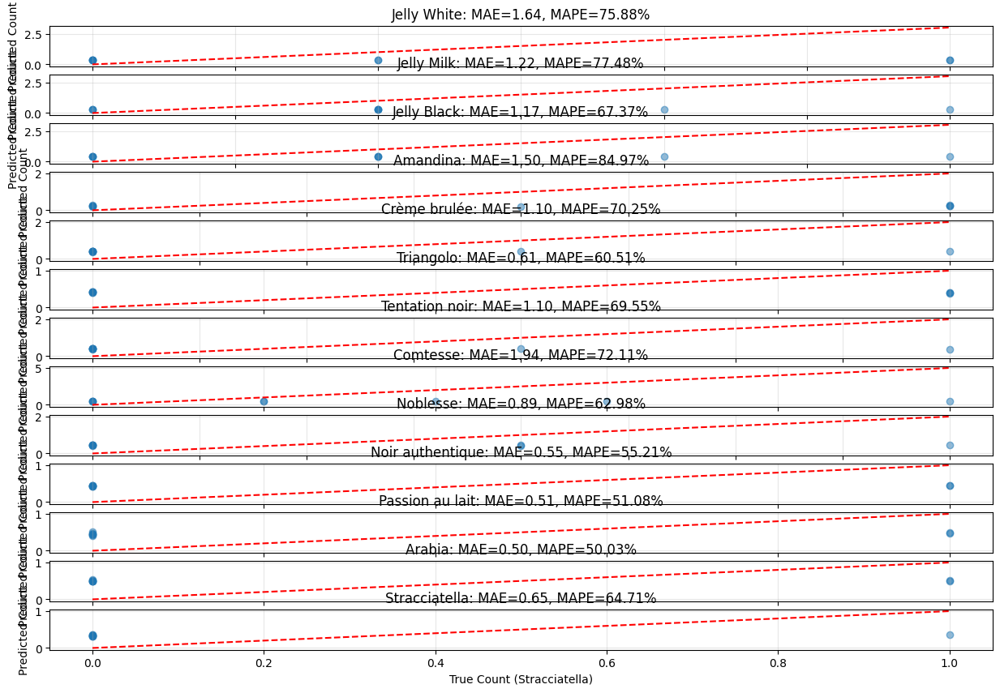

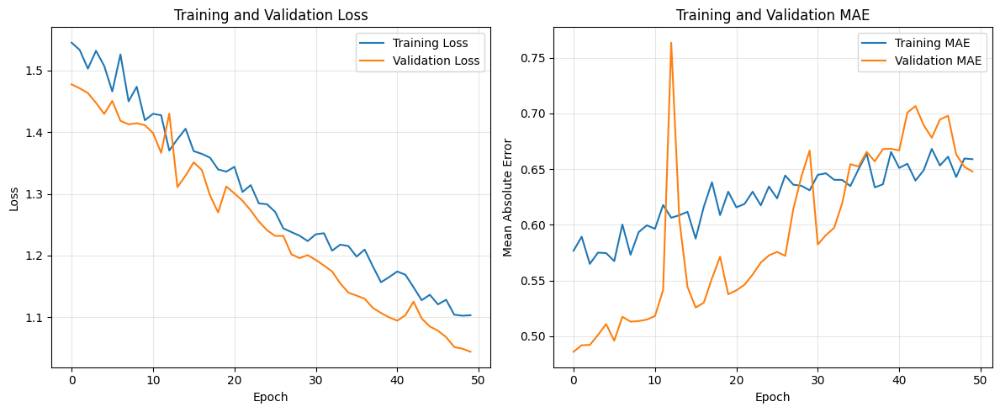

First few extracted image IDs: ['1000866', '1000808', '1000888', '1000812', '1010014']
First few annotation IDs: ['1000756', '1000763', '1000765', '1000768', '1000772']
Found 9 valid matches out of 9 images
Found 9 images with annotations
Chocolate types: ['Jelly White', 'Jelly Milk', 'Jelly Black', 'Amandina', 'Crème brulée', 'Triangolo', 'Tentation noir', 'Comtesse', 'Noblesse', 'Noir authentique', 'Passion au lait', 'Arabia', 'Stracciatella']


/var/folders/cb/xf0sm7hn1r96833t6t05mrz40000gq/T/ipykernel_39352/2846603730.py:18: UserWarning: Argument(s) 'var_limit' are not valid for transform GaussNoise
  A.GaussNoise(var_limit=(10.0, 50.0), p=0.3),


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step


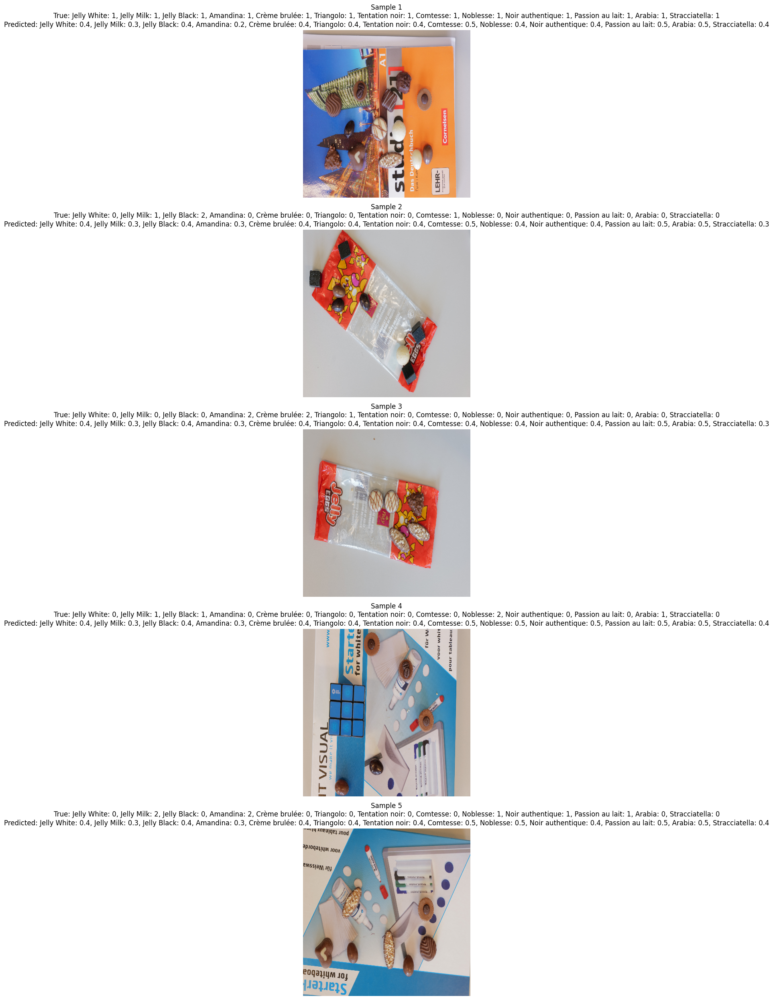


Model training and evaluation complete!
Final test metrics: {'mse': np.float32(0.8690121), 'mae': np.float32(0.67504346), 'Jelly White_mae': np.float32(1.6373827), 'Jelly White_mape': np.float32(75.88069), 'Jelly White_accuracy': np.float64(0.5555555555555556), 'Jelly Milk_mae': np.float32(1.2179531), 'Jelly Milk_mape': np.float32(77.47796), 'Jelly Milk_accuracy': np.float64(0.3333333333333333), 'Jelly Black_mae': np.float32(1.1722273), 'Jelly Black_mape': np.float32(67.367516), 'Jelly Black_accuracy': np.float64(0.4444444444444444), 'Amandina_mae': np.float32(1.503628), 'Amandina_mape': np.float32(84.96859), 'Amandina_accuracy': np.float64(0.5555555555555556), 'Crème brulée_mae': np.float32(1.1025085), 'Crème brulée_mape': np.float32(70.24548), 'Crème brulée_accuracy': np.float64(0.7777777777777778), 'Triangolo_mae': np.float32(0.6050586), 'Triangolo_mape': np.float32(60.50586), 'Triangolo_accuracy': np.float64(0.6666666666666666), 'Tentation noir_mae': np.float32(1.1018611), 'Tentat

In [31]:
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
import time
import os
import glob 

def prepare_training_data(image_dir, annotation_csv, val_split=0.2, test_split=0.1, random_state=42):
    """
    Prepare training, validation and test data splits
    
    Args:
        image_dir: Directory containing images
        annotation_csv: Path to CSV with chocolate counts
        val_split: Fraction of data to use for validation
        test_split: Fraction of data to use for testing
        random_state: Random seed for reproducibility
        
    Returns:
        Dictionary with train, val, test image paths and annotations DataFrame
    """
    # Load annotations
    annotations_df = pd.read_csv(annotation_csv)
    print(f"Loaded annotations for {len(annotations_df)} images")
    
    # Convert IDs to strings in the annotation dataframe
    annotations_df['id'] = annotations_df['id'].astype(str)
    
    # Print sample IDs from annotation file
    print("Sample IDs from annotations file:", annotations_df['id'].head().tolist())
    
    # Get all image files
    all_image_files = []
    for ext in ['.jpg', '.JPG', '.jpeg', '.JPEG', '.png', '.PNG']:
        all_image_files.extend(glob.glob(os.path.join(image_dir, f'*{ext}')))
    
    print(f"Found {len(all_image_files)} image files in directory")
    
    # Print sample filenames from directory
    print("Sample filenames:", [os.path.basename(f) for f in all_image_files[:5]])
    
    # Extract IDs from filenames and match with annotations
    valid_images = []
    image_ids = []
    
    for img_path in all_image_files:
        filename = os.path.basename(img_path)
        # Remove L prefix if present and extension
        if filename.startswith('L'):
            img_id = filename[1:].split('.')[0]  # Remove 'L' from the beginning
        else:
            img_id = filename.split('.')[0]
        
        # Debug output for first few images
        if len(valid_images) < 5:
            print(f"Processing {filename} -> extracted ID: '{img_id}'")
            print(f"  Is in annotations: {img_id in annotations_df['id'].values}")
        
        # Check if extracted ID is in the annotations
        if img_id in annotations_df['id'].values:
            valid_images.append(img_path)
            image_ids.append(img_id)
    
    print(f"Found {len(valid_images)} images with matching annotations")
    
    # If we still have no matches, try more flexible matching
    if len(valid_images) == 0:
        print("No matches found with strict comparison. Trying more flexible approach...")
        valid_images = []
        image_ids = []
        
        for img_path in all_image_files:
            filename = os.path.basename(img_path)
            # Try multiple ID extraction methods
            potential_ids = [
                filename.split('.')[0],                    # Full filename without extension
                filename.replace('L', '').split('.')[0],   # Remove L and extension
                filename[1:].split('.')[0] if filename.startswith('L') else filename.split('.')[0]  # Conditional
            ]
            
            # Try to find a match with any extraction method
            for img_id in potential_ids:
                if img_id in annotations_df['id'].values:
                    valid_images.append(img_path)
                    image_ids.append(img_id)
                    # Print successful match for first few
                    if len(valid_images) <= 5:
                        print(f"Match found: {filename} -> {img_id}")
                    break
        
        print(f"Flexible matching found {len(valid_images)} images with annotations")
    
    # Ensure we have matches before splitting
    if len(valid_images) == 0:
        raise ValueError("No matching images found. Cannot proceed with training.")
    
    # Split data into train+val and test
    train_val_imgs, test_imgs, train_val_ids, test_ids = train_test_split(
        valid_images, image_ids, test_size=test_split, random_state=random_state
    )
    
    # Split train+val into train and val
    train_imgs, val_imgs, train_ids, val_ids = train_test_split(
        train_val_imgs, train_val_ids, test_size=val_split/(1-test_split), random_state=random_state
    )
    
    print(f"Split data into {len(train_imgs)} training, {len(val_imgs)} validation, and {len(test_imgs)} test images")
    
    return {
        'train_images': train_imgs,
        'val_images': val_imgs,
        'test_images': test_imgs,
        'train_ids': train_ids,
        'val_ids': val_ids,
        'test_ids': test_ids,
        'annotations': annotations_df
    }

def train_and_evaluate_model(data_splits, batch_size=8, input_size=(416, 416), epochs=50, annotation_csv_path=None):
    """
    Train and evaluate the chocolate counting model using the provided data splits
    
    Args:
        data_splits: Dictionary with data splits from prepare_training_data
        batch_size: Batch size for training
        input_size: Input image size (height, width)
        epochs: Number of training epochs
        annotation_csv_path: Path to the CSV file with annotations (optional)
        
    Returns:
        Trained model, training history, and evaluation metrics
    """
    # If annotation_csv_path is not provided, use the one in data_splits
    if annotation_csv_path is None:
        annotation_csv_path = data_splits.get('annotation_csv', None)
    
    # Create data generators
    train_generator = ChocolateCountDataGenerator(
        image_paths=data_splits['train_images'],
        annotation_csv=annotation_csv_path,  # Use the path
        batch_size=batch_size,
        input_size=input_size,
        shuffle=True,
        augment=True
    )
    
    val_generator = ChocolateCountDataGenerator(
        image_paths=data_splits['val_images'],
        annotation_csv=annotation_csv_path,  # Use the path
        batch_size=batch_size,
        input_size=input_size,
        shuffle=False,
        augment=False
    )
    
    test_generator = ChocolateCountDataGenerator(
        image_paths=data_splits['test_images'],
        annotation_csv=annotation_csv_path,  # Use the path
        batch_size=batch_size,
        input_size=input_size,
        shuffle=False,
        augment=False
    )
    
    # Configure callbacks
    model_dir = 'chocolate_counter_models'
    os.makedirs(model_dir, exist_ok=True)
    
    timestamp = time.strftime("%Y%m%d-%H%M%S")
    model_prefix = os.path.join(model_dir, f"choc_counter_{timestamp}")
    
    callbacks = [
        tf.keras.callbacks.ModelCheckpoint(
            filepath=f"{model_prefix}_best.h5",
            monitor='val_loss',
            save_best_only=True,
            save_weights_only=False,
            verbose=1
        ),
        tf.keras.callbacks.TensorBoard(
            log_dir=f"logs/choc_counter_{timestamp}",
            histogram_freq=1
        ),
        tf.keras.callbacks.ReduceLROnPlateau(
            monitor='val_loss',
            factor=0.5,
            patience=5,
            verbose=1,
            min_lr=1e-6
        ),
        tf.keras.callbacks.EarlyStopping(
            monitor='val_loss',
            patience=15,
            verbose=1,
            restore_best_weights=True
        )
    ]
    
    # Create and train the model
    model, history = train_chocolate_counting_model(
        train_generator=train_generator,
        validation_generator=val_generator,
        epochs=epochs,
        callbacks=callbacks
    )
    
    # Evaluate the model on test data
    print("\nEvaluating model on test data:")
    test_metrics = evaluate_chocolate_counter(model, test_generator)
    
    # Plot training history
    plt.figure(figsize=(12, 5))
    
    plt.subplot(1, 2, 1)
    plt.plot(history.history['loss'], label='Training Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    plt.title('Training and Validation Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()
    plt.grid(alpha=0.3)
    
    plt.subplot(1, 2, 2)
    plt.plot(history.history['mae'], label='Training MAE')
    plt.plot(history.history['val_mae'], label='Validation MAE')
    plt.title('Training and Validation MAE')
    plt.xlabel('Epoch')
    plt.ylabel('Mean Absolute Error')
    plt.legend()
    plt.grid(alpha=0.3)
    
    plt.tight_layout()
    plt.savefig(f"{model_prefix}_training_history.png")
    plt.show()
    
    return model, history, test_metrics

def visualize_predictions(model, test_generator, num_samples=5):
    """
    Visualize model predictions on sample test images
    
    Args:
        model: Trained chocolate counting model
        test_generator: Data generator for test set
        num_samples: Number of samples to visualize
    """
    # Get samples from test set
    sample_images = []
    sample_true_counts = []
    
    for i in range(min(num_samples, len(test_generator))):
        images, counts = test_generator[i]
        sample_images.append(images)
        sample_true_counts.append(counts)
    
    # Flatten the batches
    sample_images = np.vstack(sample_images)
    sample_true_counts = np.vstack(sample_true_counts)
    
    # Select a subset of samples
    indices = np.random.choice(len(sample_images), min(num_samples, len(sample_images)), replace=False)
    selected_images = sample_images[indices]
    selected_counts = sample_true_counts[indices]
    
    # Make predictions
    predicted_counts = model.predict(selected_images)
    
    # Visualize results
    plt.figure(figsize=(15, 5 * len(indices)))
    
    for i, idx in enumerate(range(len(selected_images))):
        plt.subplot(len(indices), 1, i+1)
        plt.imshow(selected_images[idx])
        
        # Format count information
        true_counts_str = ", ".join([f"{test_generator.chocolate_types[j]}: {int(selected_counts[idx][j])}" 
                                     for j in range(len(test_generator.chocolate_types))])
        
        pred_counts_str = ", ".join([f"{test_generator.chocolate_types[j]}: {predicted_counts[idx][j]:.1f}" 
                                    for j in range(len(test_generator.chocolate_types))])
        
        plt.title(f"Sample {i+1}\nTrue: {true_counts_str}\nPredicted: {pred_counts_str}", fontsize=12)
        plt.axis('off')
    
    plt.tight_layout()
    plt.savefig("chocolate_count_predictions.png")
    plt.show()

# Run the complete training and evaluation pipeline
try:
    # Set paths to your data
    image_dir = '/Users/sherwood/Desktop/study/EPFL/IM/project/dataset_project_iapr2025/train'
    annotation_csv = '/Users/sherwood/Desktop/study/EPFL/IM/project/dataset_project_iapr2025/train.csv'
    
    # Add the annotation_csv path to data_splits for future reference
    data_splits = prepare_training_data(
        image_dir=image_dir, 
        annotation_csv=annotation_csv,
        val_split=0.15,
        test_split=0.1
    )
    data_splits['annotation_csv'] = annotation_csv  # Add this line
    
    # Train and evaluate the model
    model, history, metrics = train_and_evaluate_model(
        data_splits=data_splits,
        batch_size=8,
        input_size=(416, 416),
        epochs=50,
        annotation_csv_path=annotation_csv  # Pass it this way
    )
    
    # Create test generator for visualization
    test_generator = ChocolateCountDataGenerator(
        image_paths=data_splits['test_images'],
        annotation_csv=annotation_csv,
        batch_size=4,
        input_size=(416, 416),
        shuffle=False,
        augment=False
    )
    
    # Visualize some predictions
    visualize_predictions(model, test_generator, num_samples=5)
    
    print("\nModel training and evaluation complete!")
    print(f"Final test metrics: {metrics}")
    print(f"Model saved to: chocolate_counter_models/")

except Exception as e:
    print(f"Error during training and evaluation: {e}")
    import traceback
    traceback.print_exc()